# Venuka Wijenayake

# Project Goal: Melbourne Tree Species Analysis for Conservation Efforts

## Objective
Conduct an in-depth analysis of the range of tree species in the Melbourne area, comparing historical data from pre-colonial times with current records. This study aims to identify changes in tree diversity, highlighting species that have diminished in numbers or variety. The ultimate goal is to provide evidence-based recommendations to local councils for tree planting programs, prioritizing species that need increased numbers to restore ecological balance and enhance urban biodiversity.

## Key Activities
- **Historical Data Collection:** Gather and analyze historical records and indigenous knowledge to identify the pre-colonial tree species composition.
- **Current Species Survey:** Utilize current botanical surveys, remote sensing data, and council records to compile an up-to-date list of tree species within Melbourne.
- **Comparative Analysis:** Compare historical and current data to identify trends, losses, or gains in tree species diversity.
- **Recommendation Development:** Based on the analysis, recommend tree species that need conservation focus and increased numbers in planting programs.

## Expected Outcome
A comprehensive report detailing changes in Melbourne's tree species over time, with actionable recommendations for local councils to inform future tree planting initiatives, aiming to restore lost tree species and enhance urban green spaces.

## Impact
This project not only contributes to the conservation of Melbourne’s botanical heritage but also supports urban sustainability efforts. By informing council tree planting programs with a focus on biodiversity, we can work towards a greener, more resilient Melbourne for future generations.


In [3]:
import requests
import pandas as pd
import os

def fetch_data(base_url, dataset, api_key, num_records=99, offset=0):
    all_records = []
    max_offset = 9900  # Maximum number of requests

    while True:
        # maximum limit check
        if offset > max_offset:
            break

        # Create API request URL
        filters = f'{dataset}/records?limit={num_records}&offset={offset}'
        url = f'{base_url}{filters}&api_key={api_key}'

        # Start request
        try:
            result = requests.get(url, timeout=10)
            result.raise_for_status()
            records = result.json().get('results')
        except requests.exceptions.RequestException as e:
            raise Exception(f"API request failed: {e}")
        if records is None:
            break
        all_records.extend(records)
        if len(records) < num_records:
            break

        # next cycle offset
        offset += num_records

    # DataFrame all data
    df = pd.DataFrame(all_records)
    return df

API_KEY = os.environ.get('MELBOURNE_API_KEY', input("Please enter your API key: "))
BASE_URL = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'

Please enter your API key:  a0d28c08580df90345c0c34846cf94b614eb5071d598c3b885237828


In [4]:
# data set name
PRE_COLONIAL_TREES = 'pre-colonial-plant-list'

pre_colonial_trees = fetch_data(BASE_URL, PRE_COLONIAL_TREES, API_KEY)

pre_colonial_trees

,species,common_name_s,certain,beach_and_dunes,saltmarsh,coastal_marshlands_and_brackish_flats,swamp_scrub,woodlands_and_heathlands_on_sand,woodlands_and_forests_on_sedimentary_hills_valleys_and_ridges,grasslands_and_woodlands_on_fertile_plains,cliffs_and_escarpments,river_banks_and_creeklines,wet_heathland,freshwater_wetland,saltwater_wetland,most_likely_occurrence,epbc_category_of_threat,ffg_extinction_risk,ffg_category_of_threat
0,Acacia mucronata var. longifolia,"Narrow-leaf Wattle, Variable Sallow Wattle",NaN,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1.0,None,None,None
1,Acacia pycnantha,Golden Wattle,1.0,0.0,0.0,0.0,1.0,2.1,3.2,3.1,2.1,2.1,0.0,0.0,0,3.2,None,None,None
2,Acacia verticillata var. verticillata,Prickly Moses,NaN,0.0,0.0,0.0,3.1,3.1,0.0,0.0,0.0,3.1,1.0,0.0,0,3.1,None,None,None
3,Acaena echinata,Sheep's Burr,1.0,0.0,0.0,0.0,0.0,1.0,3.1,3.1,3.1,2.1,0.0,0.0,0,3.1,None,None,None
4,Acrotriche prostrata,Trailing Ground-Berry,NaN,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1.0,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1062,Xanthorrhoea minor subsp. lutea,"Small Grass Tree, Toolimerin",NaN,0.0,0.0,0.0,0.0,2.1,1.0,0.0,0.0,0.0,0.0,0.0,0,2.1,None,None,None
1063,Xerochrysum bracteatum,"Golden Everlasting, Straw Flower",NaN,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0,None,None,None
1064,Zostera muelleri subsp. capricorni,Eel-grass,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,3.2,None,None,None
1065,Zostera muelleri subsp. muelleri,Dwarf Grass-wrack,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2.2,None,None,None


In [5]:
# data set name
CURRENT_TREES = 'trees-with-species-and-dimensions-urban-forest'

current_trees = fetch_data(BASE_URL, CURRENT_TREES, API_KEY)

current_trees

,com_id,common_name,scientific_name,genus,family,diameter_breast_height,year_planted,date_planted,age_description,useful_life_expectency,useful_life_expectency_value,precinct,located_in,uploaddate,coordinatelocation,latitude,longitude,easting,northing,geolocation
0,1546404,River Sheoak,Casuarina cunninghamiana,Casuarina,Casuarinaceae,NaN,2013,2013-01-07,None,None,NaN,None,Park,2021-01-10,"{'lon': 144.97177997020128, 'lat': -37.8180699...",-37.818070,144.971780,321479.34,5812432.31,"{'lon': 144.97177997020128, 'lat': -37.8180699..."
1,1038666,Claret Ash,Fraxinus angustifolia subsp. oxycarpa,Fraxinus,Oleaceae,26.0,1998,1998-11-09,Semi-Mature,11-20 years,20.0,None,Park,2021-01-10,"{'lon': 144.96069216093832, 'lat': -37.7815772...",-37.781577,144.960692,320414.93,5816460.51,"{'lon': 144.96069216093832, 'lat': -37.7815772..."
2,1439845,Kanooka,Tristaniopsis laurina,Tristaniopsis,Myrtaceae,NaN,2009,2009-09-08,None,None,NaN,None,Street,2021-01-10,"{'lon': 144.9455194257097, 'lat': -37.79259845...",-37.792598,144.945519,319105.53,5815208.27,"{'lon': 144.9455194257097, 'lat': -37.79259845..."
3,1070962,Spotted Gum,Corymbia maculata,Corymbia,Myrtaceae,17.0,2007,2007-06-14,Semi-Mature,31-60 years,60.0,None,Street,2021-01-10,"{'lon': 144.9421772126995, 'lat': -37.78013819...",-37.780138,144.942177,318780.78,5816584.46,"{'lon': 144.9421772126995, 'lat': -37.78013819..."
4,1066252,River red gum,Eucalyptus camaldulensis,Eucalyptus,Myrtaceae,19.0,2006,2006-02-20,Semi-Mature,61+ years,80.0,None,Street,2021-01-10,"{'lon': 144.92039340703647, 'lat': -37.7905765...",-37.790577,144.920393,316887.98,5815383.70,"{'lon': 144.92039340703647, 'lat': -37.7905765..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1066718,Yellow Box,Eucalyptus melliodora,Eucalyptus,Myrtaceae,NaN,2006,2006-09-14,None,None,NaN,None,Park,2021-01-10,"{'lon': 144.9546546149572, 'lat': -37.78488602...",-37.784886,144.954655,319891.23,5816081.73,"{'lon': 144.9546546149572, 'lat': -37.78488602..."
9995,1735402,Manuka,Kunzea ericoides,Kunzea,Myrtaceae,NaN,2018,2018-05-30,None,None,NaN,None,Park,2021-01-10,"{'lon': 144.9514066985289, 'lat': -37.79316880...",-37.793169,144.951407,319625.34,5815156.36,"{'lon': 144.9514066985289, 'lat': -37.79316880..."
9996,1656707,Norfolk Island Pine,Araucaria heterophylla,Araucaria,Araucariaceae,NaN,2017,2017-04-26,None,None,NaN,None,Street,2021-01-10,"{'lon': 144.9471755893213, 'lat': -37.81988993...",-37.819890,144.947176,319317.91,5812183.04,"{'lon': 144.9471755893213, 'lat': -37.81988993..."
9997,1604462,Lightwood Wattle,Acacia implexa,Acacia,Fabaceae,NaN,2015,2015-08-25,None,None,NaN,None,Park,2021-01-10,"{'lon': 144.9524311587096, 'lat': -37.79529060...",-37.795291,144.952431,319720.71,5814922.89,"{'lon': 144.9524311587096, 'lat': -37.79529060..."


## Preprocess the Data

### Displaying Available Columns

In [55]:
# Print available columns in the pre-colonial trees cleaned dataset
print("Available columns in pre-colonial trees dataset:")
print(pre_colonial_trees.columns.tolist())

# Print available columns in the current trees cleaned dataset
print("\nAvailable columns in current trees dataset:")
print(current_trees.columns.tolist())

Available columns in pre-colonial trees dataset:
['species', 'common_name_s', 'certain', 'beach_and_dunes', 'saltmarsh', 'coastal_marshlands_and_brackish_flats', 'swamp_scrub', 'woodlands_and_heathlands_on_sand', 'woodlands_and_forests_on_sedimentary_hills_valleys_and_ridges', 'grasslands_and_woodlands_on_fertile_plains', 'cliffs_and_escarpments', 'river_banks_and_creeklines', 'wet_heathland', 'freshwater_wetland', 'saltwater_wetland', 'most_likely_occurrence', 'epbc_category_of_threat', 'ffg_extinction_risk', 'ffg_category_of_threat']

Available columns in current trees dataset:
['com_id', 'common_name', 'scientific_name', 'genus', 'family', 'diameter_breast_height', 'year_planted', 'date_planted', 'age_description', 'useful_life_expectency', 'useful_life_expectency_value', 'precinct', 'located_in', 'uploaddate', 'coordinatelocation', 'latitude', 'longitude', 'easting', 'northing', 'geolocation']


### Removing unwanted columns

In [56]:
# Import pandas library if you haven't already
import pandas as pd

# Columns to remove from the pre-colonial dataset
columns_to_remove_pre_colonial = ['epbc_category_of_threat', 'ffg_extinction_risk', 'ffg_category_of_threat', 'certain']

# Removing the specified columns from the pre-colonial trees dataset
pre_colonial_trees_cleaned = pre_colonial_trees.drop(columns=columns_to_remove_pre_colonial)

# Print available columns in the pre-colonial trees cleaned dataset after removal
print("Available columns in pre-colonial trees dataset after removal:")
print(pre_colonial_trees_cleaned.columns.tolist())

# Columns to remove from the current trees dataset
columns_to_remove_current = ['age_description', 'useful_life_expectency', 'useful_life_expectency_value', 'precinct', 'diameter_breast_height', 'coordinatelocation', 'easting', 'northing', 'geolocation']

# Removing the specified columns from the current trees dataset
current_trees_cleaned = current_trees.drop(columns=columns_to_remove_current)

# Print available columns in the current trees cleaned dataset after removal
print("\nAvailable columns in current trees dataset after removal:")
print(current_trees_cleaned.columns.tolist())

Available columns in pre-colonial trees dataset after removal:
['species', 'common_name_s', 'beach_and_dunes', 'saltmarsh', 'coastal_marshlands_and_brackish_flats', 'swamp_scrub', 'woodlands_and_heathlands_on_sand', 'woodlands_and_forests_on_sedimentary_hills_valleys_and_ridges', 'grasslands_and_woodlands_on_fertile_plains', 'cliffs_and_escarpments', 'river_banks_and_creeklines', 'wet_heathland', 'freshwater_wetland', 'saltwater_wetland', 'most_likely_occurrence']

Available columns in current trees dataset after removal:
['com_id', 'common_name', 'scientific_name', 'genus', 'family', 'year_planted', 'date_planted', 'located_in', 'uploaddate', 'latitude', 'longitude']


### Printing Available Columns after Removing Unwanted Columns

In [57]:
# Print available columns in the pre-colonial trees cleaned dataset
print("Available columns in pre-colonial trees dataset:")
print(pre_colonial_trees_cleaned.columns.tolist())

# Print available columns in the current trees cleaned dataset
print("\nAvailable columns in current trees dataset:")
print(current_trees_cleaned.columns.tolist())

Available columns in pre-colonial trees dataset:
['species', 'common_name_s', 'beach_and_dunes', 'saltmarsh', 'coastal_marshlands_and_brackish_flats', 'swamp_scrub', 'woodlands_and_heathlands_on_sand', 'woodlands_and_forests_on_sedimentary_hills_valleys_and_ridges', 'grasslands_and_woodlands_on_fertile_plains', 'cliffs_and_escarpments', 'river_banks_and_creeklines', 'wet_heathland', 'freshwater_wetland', 'saltwater_wetland', 'most_likely_occurrence']

Available columns in current trees dataset:
['com_id', 'common_name', 'scientific_name', 'genus', 'family', 'year_planted', 'date_planted', 'located_in', 'uploaddate', 'latitude', 'longitude']


### Renaming Columns to Match Datasets

In [58]:
# Rename "Scientific Name" column to "Species" in the current trees dataset
current_trees_renamed = current_trees_cleaned.rename(columns={"scientific_name": "species"})

# Verify the column renaming by printing the columns of the updated DataFrame
print("Available columns in current trees dataset after renaming:")
print(current_trees_renamed.columns.tolist())


Available columns in current trees dataset after renaming:
['com_id', 'common_name', 'species', 'genus', 'family', 'year_planted', 'date_planted', 'located_in', 'uploaddate', 'latitude', 'longitude']


In [10]:
# Specify the path and file name for the CSV file you want to create
file_path = 'C:/Users/venuk/Downloads/current_trees_renamed.csv'

# Export the DataFrame to a CSV file
current_trees_renamed.to_csv(file_path, index=False)

# If you need to provide a link to download the file (in a Jupyter environment, for example)
print(f"Data exported to {file_path}")


Data exported to C:/Users/venuk/Downloads/current_trees_renamed.csv


In [11]:
# Specify the path and file name for the CSV file you want to create
file_path = 'C:/Users/venuk/Downloads/pre_colonial_trees_cleaned.csv'

# Export the DataFrame to a CSV file
pre_colonial_trees_cleaned.to_csv(file_path, index=False)

# If you need to provide a link to download the file (in a Jupyter environment, for example)
print(f"Data exported to {file_path}")


Data exported to C:/Users/venuk/Downloads/pre_colonial_trees_cleaned.csv


## Analysis & Visualization

### 1. Historical vs. Current Species Diversity (Venn Diagram)

In [12]:
!pip install matplotlib-venn

Defaulting to user installation because normal site-packages is not writeable


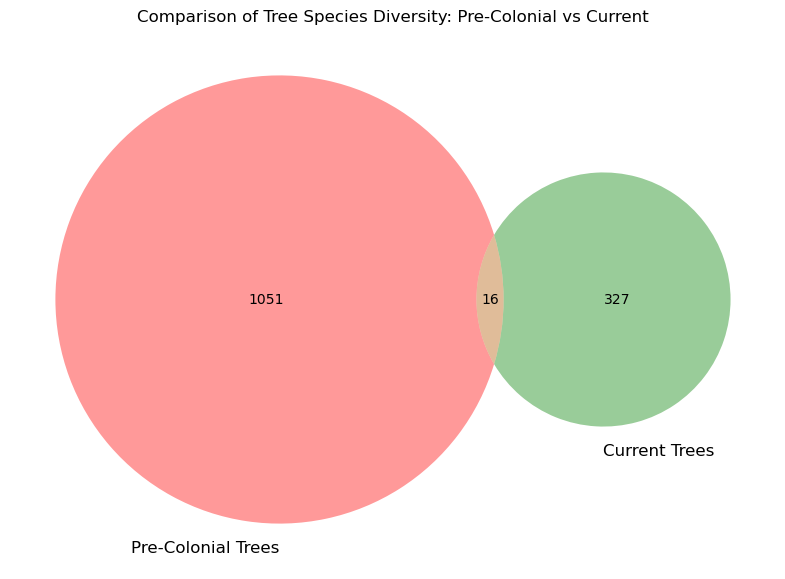

In [13]:
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

# Extracting species lists from both datasets
pre_colonial_species = set(pre_colonial_trees_cleaned['species'].unique())
current_species = set(current_trees_renamed['species'].unique())

# Creating the Venn diagram
plt.figure(figsize=(10, 7))
venn2([pre_colonial_species, current_species], ('Pre-Colonial Trees', 'Current Trees'))
plt.title('Comparison of Tree Species Diversity: Pre-Colonial vs Current')
plt.show()

### 2. Change in Species Abundance Over Time

In [14]:
# Extract species sets
pre_colonial_species = set(pre_colonial_trees_cleaned['species'].unique())
current_species = set(current_trees_renamed['species'].unique())

# Determine shared and unique species
shared_species = pre_colonial_species.intersection(current_species)
lost_species = pre_colonial_species.difference(current_species)
gained_species = current_species.difference(pre_colonial_species)

# Print results
print(f"Shared Species: {len(shared_species)}")
print(f"Lost Species: {len(lost_species)}")
print(f"Gained Species: {len(gained_species)}")


Shared Species: 16
Lost Species: 1051
Gained Species: 327


### 3. Geographical Distribution of Trees (Map Visualization)

In [15]:
import folium

# Initialize a map centered around Melbourne
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# Create FeatureGroups for parks and streets
park_layer = folium.FeatureGroup(name='Parks')
street_layer = folium.FeatureGroup(name='Streets')

# Adding tree locations to the map with filtering for 'located_in'
for idx, row in current_trees_renamed.iterrows():
    if row['located_in'] == 'Park':
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=3,  # Slightly larger radius for better visibility
            color='green',
            fill=True,
            fill_color='green',
            popup=f"Species: {row['species']}, Planted: {row['date_planted']}"
        ).add_to(park_layer)
    elif row['located_in'] == 'Street':
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=3,  # Consistent with park marker size
            color='red',
            fill=True,
            fill_color='red',
            popup=f"Species: {row['species']}, Planted: {row['date_planted']}"
        ).add_to(street_layer)

# Add layers to the map
park_layer.add_to(melbourne_map)
street_layer.add_to(melbourne_map)

# Add LayerControl to switch between the layers
folium.LayerControl().add_to(melbourne_map)

# Display the map
melbourne_map


### 4. Time-Series Analysis of Tree Planting

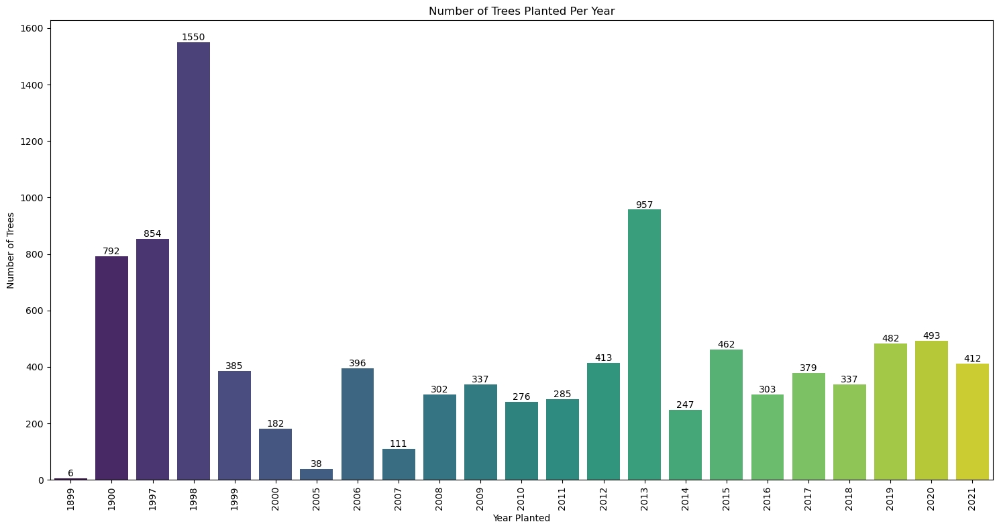

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Ensure the 'year_planted' column is treated as integers
current_trees_renamed['year_planted'] = pd.to_numeric(current_trees_renamed['year_planted'], errors='coerce')

# Filtering out any rows where 'year_planted' might be zero or invalid
current_trees_filtered = current_trees_renamed[current_trees_renamed['year_planted'] > 0]

# Create the plot
plt.figure(figsize=(15, 8))
ax = sns.countplot(x='year_planted', data=current_trees_filtered, palette='viridis')
plt.xticks(rotation=90)
plt.title('Number of Trees Planted Per Year')
plt.ylabel('Number of Trees')
plt.xlabel('Year Planted')

# Adding counts above the bars
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

### 5. Habitat Analysis for Pre-Colonial Species

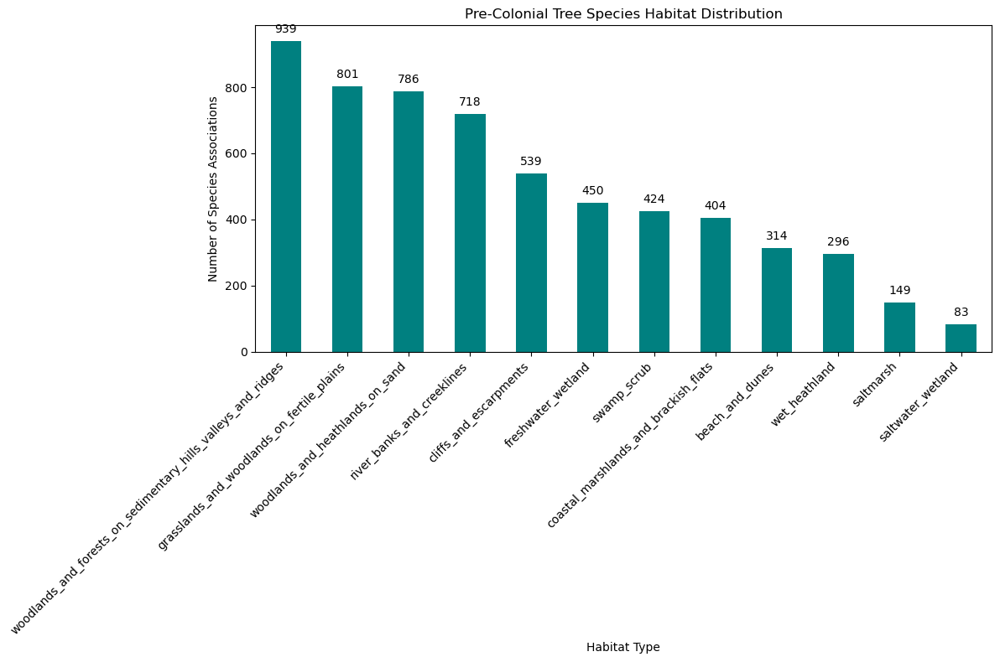

In [17]:
import matplotlib.pyplot as plt

# Summing up habitat data
habitat_data = pre_colonial_trees_cleaned.drop(columns=['species', 'common_name_s', 'most_likely_occurrence'])
habitat_totals = habitat_data.sum().sort_values(ascending=False)

# Plotting habitat data
plt.figure(figsize=(12, 8))  # Adjusted figure size for better fit
ax = habitat_totals.plot(kind='bar', color='teal')
plt.title('Pre-Colonial Tree Species Habitat Distribution')
plt.ylabel('Number of Species Associations')
plt.xlabel('Habitat Type')
plt.xticks(rotation=45, ha='right')  # Adjust label alignment and rotation
plt.tight_layout()  # Adjust layout to make room for label text

# Adding text annotations at the top of each bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', color='black', xytext=(0, 5), textcoords='offset points')

plt.show()

### 6. Ecological Dynamics of Tree Species in Parks vs. Streets in Melbourne

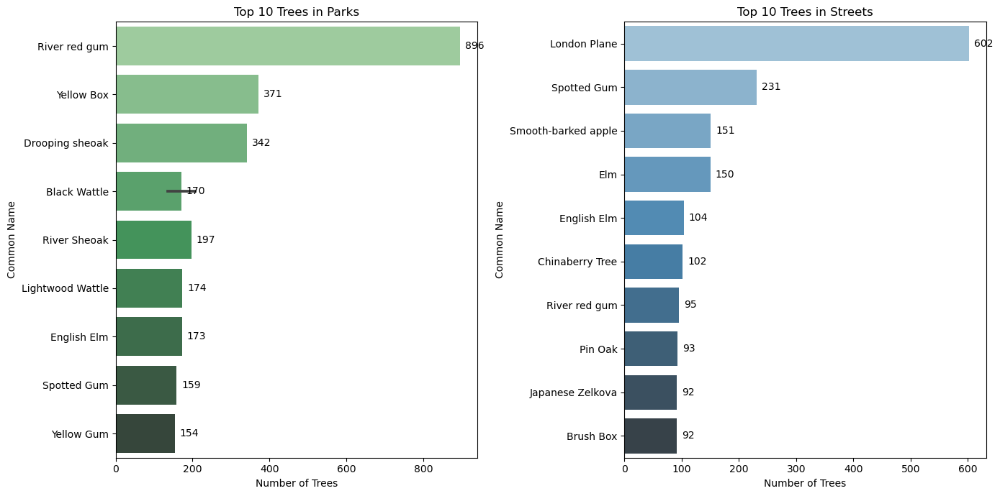

Trees in Parks:
                     common_name                                  species  count
                   River red gum                 Eucalyptus camaldulensis    896
                      Yellow Box                    Eucalyptus melliodora    371
                 Drooping sheoak               Allocasuarina verticillata    342
                    Black Wattle                          Acacia mearnsii    206
                    River Sheoak                 Casuarina cunninghamiana    197
                Lightwood Wattle                           Acacia implexa    174
                     English Elm                            Ulmus procera    173
                     Spotted Gum                        Corymbia maculata    159
                      Yellow Gum                    Eucalyptus leucoxylon    154
                    Black Wattle                       Acacia melanoxylon    135
                  Sweet Bursaria                         Bursaria spinosa    130
            

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Separate trees into parks and streets
trees_in_parks = current_trees_renamed[current_trees_renamed['located_in'] == 'Park']
trees_in_streets = current_trees_renamed[current_trees_renamed['located_in'] == 'Street']

# Focus on common names and species for simplicity
parks_info = trees_in_parks[['common_name', 'species']].value_counts().reset_index(name='count')
streets_info = trees_in_streets[['common_name', 'species']].value_counts().reset_index(name='count')

# Visualization of Species Distribution with Counts
plt.figure(figsize=(14, 7))

# Trees in Parks
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x='count', y='common_name', data=parks_info.head(10), palette='Greens_d')
plt.title('Top 10 Trees in Parks')
plt.xlabel('Number of Trees')
plt.ylabel('Common Name')
# Add counts above the bars
for p in ax1.patches:
    ax1.annotate(f'{int(p.get_width())}', (p.get_x() + p.get_width(), p.get_y() + p.get_height() / 2),
                 ha='left', va='center', xytext=(5, 0), textcoords='offset points')

# Trees in Streets
plt.subplot(1, 2, 2)
ax2 = sns.barplot(x='count', y='common_name', data=streets_info.head(10), palette='Blues_d')
plt.title('Top 10 Trees in Streets')
plt.xlabel('Number of Trees')
plt.ylabel('Common Name')
# Add counts above the bars
for p in ax2.patches:
    ax2.annotate(f'{int(p.get_width())}', (p.get_x() + p.get_width(), p.get_y() + p.get_height() / 2),
                 ha='left', va='center', xytext=(5, 0), textcoords='offset points')

plt.tight_layout()
plt.show()

# Print the lists of trees in parks and streets
print("Trees in Parks:")
print(parks_info.to_string(index=False))

print("\nTrees in Streets:")
print(streets_info.to_string(index=False))


### Identify Lost Species

In [19]:
# Set of species in the pre-colonial dataset
pre_colonial_species_set = set(pre_colonial_trees_cleaned['species'])

# Set of species in the current dataset
current_species_set = set(current_trees_renamed['species'])

# Find species that are lost (present in pre-colonial but not in current)
lost_species_set = pre_colonial_species_set.difference(current_species_set)

# Filter the pre-colonial dataset to get the common names of these lost species
lost_species_details = pre_colonial_trees_cleaned[pre_colonial_trees_cleaned['species'].isin(lost_species_set)][['species', 'common_name_s']]

# Print the lost species and their common names
print("Lost Species and Their Common Names:")
print(lost_species_details)

Lost Species and Their Common Names:
                                    species  \
0          Acacia mucronata var. longifolia   
2     Acacia verticillata var. verticillata   
3                           Acaena echinata   
4                      Acrotriche prostrata   
5                      Acrotriche serrulata   
...                                     ...   
1062        Xanthorrhoea minor subsp. lutea   
1063                 Xerochrysum bracteatum   
1064     Zostera muelleri subsp. capricorni   
1065       Zostera muelleri subsp. muelleri   
1066               Zygophyllum billardierei   

                                   common_name_s  
0     Narrow-leaf Wattle, Variable Sallow Wattle  
2                                  Prickly Moses  
3                                   Sheep's Burr  
4                          Trailing Ground-Berry  
5                                     Honey Pots  
...                                          ...  
1062                Small Grass Tree, Too

In [154]:
# Print the shape of each dataset
print("Shape of Current Trees Renamed Dataset:", current_trees_renamed.shape)
print("Shape of Pre-Colonial Trees Cleaned Dataset:", pre_colonial_trees_cleaned.shape)


Shape of Current Trees Renamed Dataset: (9999, 11)
Shape of Pre-Colonial Trees Cleaned Dataset: (1067, 15)


### Timeseries Model Fitting (ARIMA Model Forecasting)

In [162]:
# Print all column names in the DataFrame to verify the correct name of the year_planted column
print(current_trees_renamed.columns)


Index(['com_id', 'common_name', 'species', 'genus', 'family', 'year_planted',
       'date_planted', 'located_in', 'uploaddate', 'latitude', 'longitude'],
      dtype='object')


#### Step 1: Data Preparation

In [163]:
import pandas as pd
import matplotlib.pyplot as plt

# Make sure 'year' is a datetime object and extract the year if it's not just the year number
current_trees_renamed['year_planted'] = pd.to_datetime(current_trees_renamed['year_planted'], format='%Y').dt.year

# Aggregate data by year to get the total count of trees planted each year
yearly_data = current_trees_renamed.groupby('year_planted').size().reset_index(name='Tree_Count')
yearly_data.set_index('year_planted', inplace=True)  # Set the year as the index, ensuring it is a datetime index for time series modeling
yearly_data.index = pd.to_datetime(yearly_data.index, format='%Y')


#### Step 2: Visualize the Data

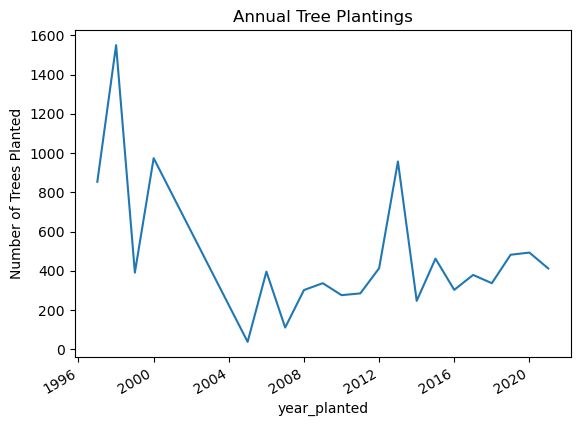

In [164]:
yearly_data['Tree_Count'].plot(title='Annual Tree Plantings')
plt.ylabel('Number of Trees Planted')
plt.show()


#### Step 3: Check for Stationarity

In [165]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(yearly_data['Tree_Count'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

# Interpret the p-value
if result[1] < 0.05:
    print("Data is stationary")
else:
    print("Data is not stationary, differencing might be needed")

ADF Statistic: -4.059725215509208
p-value: 0.0011281180856206002
Data is stationary


#### Step 4: Fit the ARIMA Model

In [166]:
from statsmodels.tsa.arima.model import ARIMA

# Fitting the ARIMA model (parameters should be optimized based on your specific dataset)
model = ARIMA(yearly_data['Tree_Count'], order=(1,1,1))  # Example parameters
model_fit = model.fit()

# Model summary
print(model_fit.summary())

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:             Tree_Count   No. Observations:                   21
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -142.921
Date:                Tue, 23 Apr 2024   AIC                            291.842
Time:                        17:51:54   BIC                            294.829
Sample:                             0   HQIC                           292.425
                                 - 21                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8505      0.164     -5.171      0.000      -1.173      -0.528
ma.L1          0.1938      0.330      0.588      0.557      -0.452       0.840
sigma2      8.485e+04   3.12e+04      2.720      0.0

#### Step 5: Forecast Future Plantings

In [167]:
import pandas as pd

# Example forecasts from the ARIMA model
forecast_values = model_fit.forecast(steps=5)

# Convert forecasted values to integers (rounded)
forecast_values_rounded = [int(round(value)) for value in forecast_values]

# Create a DataFrame to display the forecast with corresponding years
forecast_years = range(2022, 2027)  # Adjust the range based on your specific needs
forecast_df = pd.DataFrame({
    'Year': forecast_years,
    'Forecasted Plantings': forecast_values_rounded
})

# Print the DataFrame to see the formatted output
print(forecast_df.to_string(index=False))

 Year  Forecasted Plantings
 2022                   463
 2023                   420
 2024                   456
 2025                   425
 2026                   452


C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


#### Step 6: Model Validation

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\P

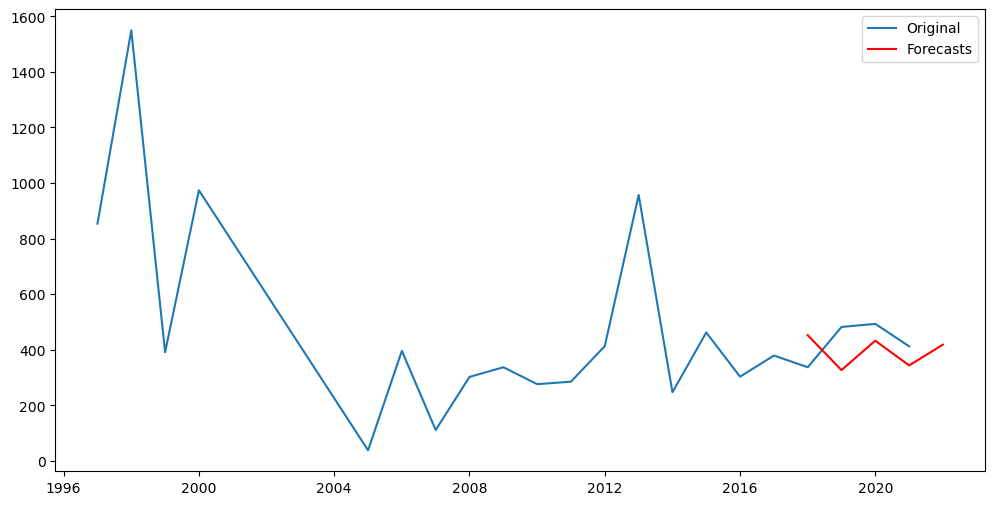

MAE: 57.82425281637918
RMSE: 77.89867939765226


In [168]:
# Splitting data into train and test sets
train = yearly_data['Tree_Count'][:-5]
test = yearly_data['Tree_Count'][-5:]

# Fit model on train data
model = ARIMA(train, order=(1,1,1))
model_fit = model.fit()

# Forecast
forecasts = model_fit.forecast(steps=5)

# Visualization of the forecast alongside actual data
plt.figure(figsize=(12,6))
plt.plot(yearly_data['Tree_Count'], label='Original')
plt.plot(pd.date_range(start=test.index[0], periods=5, freq='A'), forecasts, label='Forecasts', color='red')
plt.legend()
plt.show()

# Calculate accuracy metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error

mae = mean_absolute_error(test, forecasts)
rmse = mean_squared_error(test, forecasts, squared=False)
print('MAE:', mae)
print('RMSE:', rmse)

In [33]:
# DELETE BEFORE PUBLISHING
# This is just here so you can preview the styling on your local machine

from IPython.core.display import HTML
HTML("""
<style>
.usecase-title, .usecase-duration, .usecase-section-header {
    padding-left: 15px;
    padding-bottom: 10px;
    padding-top: 10px;
    padding-right: 15px;
    background-color: #0f9295;
    color: #fff;
}

.usecase-title {
    font-size: 1.7em;
    font-weight: bold;
}

.usecase-authors, .usecase-level, .usecase-skill {
    padding-left: 15px;
    padding-bottom: 7px;
    padding-top: 7px;
    background-color: #baeaeb;
    font-size: 1.4em;
    color: #121212;
}

.usecase-level-skill  {
    display: flex;
}

.usecase-level, .usecase-skill {
    width: 50%;
}

.usecase-duration, .usecase-skill {
    text-align: right;
    padding-right: 15px;
    padding-bottom: 8px;
    font-size: 1.4em;
}

.usecase-section-header {
    font-weight: bold;
    font-size: 1.5em;
}

.usecase-subsection-header, .usecase-subsection-blurb {
    font-weight: bold;
    font-size: 1.2em;
    color: #121212;
}

.usecase-subsection-blurb {
    font-size: 1em;
    font-style: italic;
}
</style>
""")

<div class="usecase-title">{Use Case Name}</div>

<div class="usecase-authors"><b>Authored by: </b> {Author/s}</div>

<div class="usecase-duration"><b>Duration:</b> {90} mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>{Intermediate}</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b>{Python, and add any more skills needed}</div>
</div>

<div class="usecase-section-header">Scenario</div>

{Using User Story format, write a description of the problem you are trying to solve for this use case.}

<div class="usecase-section-header">What this use case will teach you</div>

At the end of this use case you will:
- {list the skills demonstrated in your use case}

<div class="usecase-section-header">{Heading for introduction or background relating to problem}</div>

{Write your introduction here. Keep it concise. We're not after "War and Peace" but enough background information to inform the reader on the rationale for solving this problem or background non-technical information that helps explain the approach. You may also wish to give information on the datasets, particularly how to source those not being imported from the client's open data portal.}



***

_**DELETE BEFORE PUBLISHING**_

## Style guide for use cases

### Headers

For styling within your markdown cells, there are two choices you can use for headers.

1) You can use HTML classes specific to the use case styling:

```<p class="usecase-subsection-header">This is a subsection header.</p>```

<p style="font-weight: bold; font-size: 1.2em;">This is a subsection header.</p>

```<p class="usecase-subsection-blurb">This is a blurb header.</p>```

<p style="font-weight: bold; font-size: 1em; font-style:italic;">This is a blurb header.</p>


2) Or if you like you can use the markdown header styles:

```# for h1```

```## for h2```

```### for h3```

```#### for h4```

```##### for h5```

## Plot colour schemes

General advice:
1. Use the same colour or colour palette throughout your notebook, unless variety is necessary
2. Select a palette based on the type of data being represented
3. Consider accessibility (colourblindness, low vision)

#### 1) If all of your plots only use 1-2 colors use one of the company style colors:

| Light theme | Dark Theme |
|-----|-----|
|<p style="color:#2af598;">#2af598</p>|<p style="color:#08af64;">#08af64</p>|
|<p style="color:#22e4ac;">#22e4ac</p>|<p style="color:#14a38e;">#14a38e</p>|
|<p style="color:#1bd7bb;">#1bd7bb</p>|<p style="color:#0f9295;">#0f9295</p>|
|<p style="color:#14c9cb;">#14c9cb</p>|<p style="color:#056b8a;">#056b8a</p>|
|<p style="color:#0fbed8;">#0fbed8</p>|<p style="color:#121212;">#121212</p>|
|<p style="color:#08b3e5;">#08b3e5</p>||


#### 2) If your plot needs multiple colors, choose an appropriate palette using either of the following tutorials:
- https://seaborn.pydata.org/tutorial/color_palettes.html
- https://matplotlib.org/stable/tutorials/colors/colormaps.html

#### 3) Consider accessibility as well.

For qualitative plotting Seaborn's 'colorblind' palette is recommended. For maps with sequential or diverging it is recommended to use one of the Color Brewer schemes which can be previewed at https://colorbrewer2.org/.

If you want to design your own colour scheme, it should use the same principles as Cynthia Brewer's research (with variation not only in hue but also, saturation or luminance).

### References

Be sure to acknowledge your sources and any attributions using links or a reference list.

If you have quite a few references, you might wish to have a dedicated section for references at the end of your document, linked using footnote style numbers.

You can connect your in-text reference by adding the number with a HTML link: ```<a href="#fn-1">[1]</a>```

and add a matching ID in the reference list using the ```<fn>``` tag: ```<fn id="fn-1">[1] Author (Year) _Title_, Publisher, Publication location.</fn>```